# Assignment: Amazon FBA Order Data Analysis

Your assignment is to answer the following questions from the brand about their Amazon account using Python and the appropriate libraries. Where appropriate, please include visualizations with explanations. Functions should include docstrings. All work can be done within the Jupyter Notebook, but feel free to create separate files to store functions if preferred.

Hint: Think about possible unique identifiers.

You may use any libraries you prefer. Your data is contained in the orders.csv and returns.csv files in the data folder.

In [3]:
"LOAD YOUR LIBRARIES HERE"
import pandas as pd
import numpy as np
import datetime as dt
from datetime import datetime
from datetime import datetime
import matplotlib.pyplot as plt

In [4]:
"LOAD YOUR DATA HERE"
returns_df = pd.read_csv('data/pbe-returns.csv')
orders_df = pd.read_csv('data/pbe-orders.csv')

### Before you begin: Get to know your dataset.

Check out the columns and values. Notice anything about the data types? Look at how columns may relate to each other. (Hint: Notice anything weird about the 'item-price' values?)

In [13]:

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
orders_df.head()

,Unnamed: 0,Unnamed: 0.1,amazon-order-id,merchant-order-id,shipment-id,shipment-item-id,amazon-order-item-id,merchant-order-item-id,purchase-date,payments-date,shipment-date,reporting-date,buyer-email,sku,quantity-shipped,currency,item-price,item-tax,shipping-price,shipping-tax,gift-wrap-price,gift-wrap-tax,ship-service-level,recipient-name,ship-address-2,ship-address-3,ship-city,ship-state,ship-postal-code,ship-country,ship-phone-number,bill-address-1,bill-address-2,bill-address-3,bill-city,bill-state,bill-postal-code,bill-country,item-promotion-discount,ship-promotion-discount,carrier,tracking-number,estimated-arrival-date,fulfillment-center-id,fulfillment-channel,sales-channel
0,0,0,113-0579650-0481014,NaN,DH7DZNqN3,D7fc5sHtR,4.270000e+12,NaN,2020-01-02T01:11:38+00:00,2020-01-03T10:31:23+00:00,2020-01-03T10:31:25+00:00,2020-01-03T11:31:31+00:00,gxjksfsm737p9py@marketplace.amazon.com,PB-AA,1,USD,29.99,2.23,0.0,0.0,0.0,0.0,Expedited,Ryan Kirkland,NaN,NaN,SOUTH SALT LAKE,UT,84115-3307,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA587335217000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
1,1,1,111-3082907-3413041,NaN,D4PrCzqF3,DHYmgwHNR,4.940000e+13,NaN,2020-01-02T01:12:11+00:00,2020-01-02T20:45:43+00:00,2020-01-02T20:45:43+00:00,2020-01-02T23:45:49+00:00,hj2l7qlggyk9rdk@marketplace.amazon.com,PB-AA,1,USD,29.99,3.00,0.0,0.0,0.0,0.0,Expedited,Laura Nicklay,NaN,NaN,AUBURN,WA,98001-2513,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA583523516000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
2,2,2,111-0252737-4993075,NaN,DskBxB95M,DkpSJgzzR,1.880000e+13,NaN,2020-01-07T22:58:32+00:00,2020-01-08T17:39:42+00:00,2020-01-08T16:55:02+00:00,2020-01-08T17:55:08+00:00,4mptds73qpw0chc@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,Christopher Arp,NaN,NaN,IOWA CITY,IA,52245-7801,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z9Y97F00375670720,2020-01-10T04:00:00+00:00,MKC6,AFN,Amazon.com
3,3,3,114-3125779-9788249,NaN,DvYsqPS3P,Dtw6jjfmR,4.120000e+13,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AAA,1,USD,24.99,1.50,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com
4,4,4,114-3125779-9788249,NaN,DvYsqPS3P,DHwzjjfmR,6.180000e+12,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com


### Question 1: How much revenue have we made this year?

In [16]:
# revenue
income = orders_df['item-price'].sum()
income

106672.59000000001

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        106672.59
    </p>
</details>

### Question 2: What is our best selling SKU year-to-date?

Please provide the appropriate visual.

In [75]:
best_selling = orders_df.groupby('sku')['quantity-shipped'].sum()
best_selling = best_selling.to_frame()
best_selling = best_selling.sort_values('quantity-shipped')

Text(0, 0.5, 'Count of units sold')

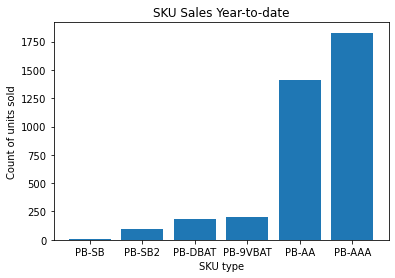

In [81]:
x = best_selling.index

fig, ax = plt.subplots()

ax.bar(x, best_selling['quantity-shipped'])
ax.set_title('SKU Sales Year-to-date')
ax.set_xlabel('SKU type')
ax.set_ylabel('Count of units sold')

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        PB-AAA (A visual showing all SKU sales would be helpful here)
    </p>
</details>

### Question 3: What is our most returned SKU YTD?

Please provide the appropriate visual.

In [77]:
returns_df.head()

,Unnamed: 0,return-date,order-id,sku,asin,fnsku,quantity,fulfillment-center-id,detailed-disposition,reason,status,license-plate-number,customer-comments
0,0,2020-07-10T10:22:18+00:00,113-5704183-7856203,PB-AA,B08268F6XN,B08268F6XN,1,LAS2,DEFECTIVE,MISSING_PARTS,Reimbursed,LPNPM202475979,cable missing
1,1,2020-07-10T07:21:36+00:00,113-5681279-7985840,PB-AA,B08268F6XN,B08268F6XN,1,LAS2,CUSTOMER_DAMAGED,SWITCHEROO,Reimbursed,LPNPM208340778,NaN
2,2,2020-07-08T20:16:58+00:00,114-5172772-0242637,PB-AAA,B08267BBJT,B08267BBJT,1,IND8,DEFECTIVE,DEFECTIVE,Unit returned to inventory,LPNN718303584,1 of the 4 batteries is 0.0v (dead on arrival).
3,3,2020-07-08T07:40:43+00:00,111-5918530-7037818,PB-AA,B08268F6XN,B08268F6XN,1,LAS2,CUSTOMER_DAMAGED,SWITCHEROO,Unit returned to inventory,LPNPM202301175,NaN
4,4,2020-07-03T11:16:59+00:00,114-8687774-9880227,PB-AAA,B08267BBJT,B08267BBJT,1,LEX2,SELLABLE,UNDELIVERABLE_UNKNOWN,Unit returned to inventory,LPNPM192580062,NaN


In [85]:
most_returned = returns_df.groupby('sku')['quantity'].agg(sum)
most_returned = most_returned.to_frame()

,quantity
sku,
PB-9VBAT,4
PB-AA,42
PB-AAA,64
PB-SB2,1


Text(0, 0.5, 'Count of returns')

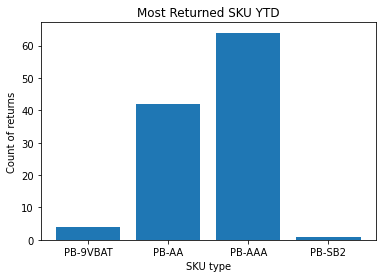

In [90]:
x = most_returned.index

fig, ax = plt.subplots()

ax.bar(x, most_returned['quantity'])
ax.set_title('Most Returned SKU YTD')
ax.set_xlabel('SKU type')
ax.set_ylabel('Count of returns')

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        PB-AAA (A visual showing all SKU sales would be helpful here)
    </p>
</details>

### Question 4: What is our overall return rate?

In [92]:
# overall return rate = total units returned / total sold

return_rate = returns_df['quantity'].agg('sum') / orders_df['quantity-shipped'].agg('sum')
return_rate

0.02975871313672922

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        0.0297
    </p>
</details>

### Question 5: What is our return rate per product?

Please provide the appropriate visual.

In [123]:
return_product = returns_df[['sku', 'quantity']].groupby('sku')['quantity'].agg('sum')
sold_product = orders_df[['sku', 'quantity-shipped']].groupby('sku')['quantity-shipped'].agg('sum')
return_rate = return_product / sold_product
return_rate = return_rate.to_frame()
return_rate['rate'] = return_rate
return_rate = return_rate.drop(columns=[0])
return_rate

,rate
sku,
PB-9VBAT,0.019608
PB-AA,0.029830
PB-AAA,0.035011
PB-DBAT,NaN
PB-SB,NaN
PB-SB2,0.010638


Text(0, 0.5, 'Return Rate')

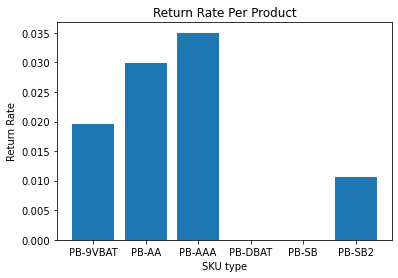

In [125]:
x = return_rate.index

fig, ax = plt.subplots()

ax.bar(x, return_rate['rate'])
ax.set_title('Return Rate Per Product')
ax.set_xlabel('SKU type')
ax.set_ylabel('Return Rate')

<details>
    <summary>
        Expected Result:
    </summary>
    
            - PB-9VBAT	0.019608
            - PB-AA	0.029830
            - PB-AAA	0.035011
            - PB-DBAT	0.000000
            - PB-SB	0.000000
            - PB-SB2	0.010638
</details>

### Question 6: How many unique customers do we have?

In [128]:
unique_customers = orders_df['buyer-email'].nunique()
unique_customers

2398

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        2398
    </p>
</details>

In [129]:
orders_df.head()

,Unnamed: 0,Unnamed: 0.1,amazon-order-id,merchant-order-id,shipment-id,shipment-item-id,amazon-order-item-id,merchant-order-item-id,purchase-date,payments-date,shipment-date,reporting-date,buyer-email,sku,quantity-shipped,currency,item-price,item-tax,shipping-price,shipping-tax,gift-wrap-price,gift-wrap-tax,ship-service-level,recipient-name,ship-address-2,ship-address-3,ship-city,ship-state,ship-postal-code,ship-country,ship-phone-number,bill-address-1,bill-address-2,bill-address-3,bill-city,bill-state,bill-postal-code,bill-country,item-promotion-discount,ship-promotion-discount,carrier,tracking-number,estimated-arrival-date,fulfillment-center-id,fulfillment-channel,sales-channel
0,0,0,113-0579650-0481014,NaN,DH7DZNqN3,D7fc5sHtR,4.270000e+12,NaN,2020-01-02T01:11:38+00:00,2020-01-03T10:31:23+00:00,2020-01-03T10:31:25+00:00,2020-01-03T11:31:31+00:00,gxjksfsm737p9py@marketplace.amazon.com,PB-AA,1,USD,29.99,2.23,0.0,0.0,0.0,0.0,Expedited,Ryan Kirkland,NaN,NaN,SOUTH SALT LAKE,UT,84115-3307,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA587335217000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
1,1,1,111-3082907-3413041,NaN,D4PrCzqF3,DHYmgwHNR,4.940000e+13,NaN,2020-01-02T01:12:11+00:00,2020-01-02T20:45:43+00:00,2020-01-02T20:45:43+00:00,2020-01-02T23:45:49+00:00,hj2l7qlggyk9rdk@marketplace.amazon.com,PB-AA,1,USD,29.99,3.00,0.0,0.0,0.0,0.0,Expedited,Laura Nicklay,NaN,NaN,AUBURN,WA,98001-2513,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA583523516000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
2,2,2,111-0252737-4993075,NaN,DskBxB95M,DkpSJgzzR,1.880000e+13,NaN,2020-01-07T22:58:32+00:00,2020-01-08T17:39:42+00:00,2020-01-08T16:55:02+00:00,2020-01-08T17:55:08+00:00,4mptds73qpw0chc@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,Christopher Arp,NaN,NaN,IOWA CITY,IA,52245-7801,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z9Y97F00375670720,2020-01-10T04:00:00+00:00,MKC6,AFN,Amazon.com
3,3,3,114-3125779-9788249,NaN,DvYsqPS3P,Dtw6jjfmR,4.120000e+13,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AAA,1,USD,24.99,1.50,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com
4,4,4,114-3125779-9788249,NaN,DvYsqPS3P,DHwzjjfmR,6.180000e+12,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com


### Question 7: How do sales look over time YTD? What were our 5 best selling days by units?

Please provide visuals of sales over time by day and our best 5 days.

In [263]:
# best_selling_days = orders_df[['quantity-shipped', 'purchase-date']]
# best_selling_days['purchase-date'] = pd.to_datetime(best_selling_days['purchase-date'], utc=True)

/Users/katiejohnson/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [277]:
# best_selling_days['norm-purch-date'] = pd.DatetimeIndex(best_selling_days['purchase-date']).normalize()
# best_selling_days_2 = best_selling_days

/Users/katiejohnson/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
# best_selling_days_3 = best_selling_days_2.drop(columns='purchase-date')

In [284]:
best_selling_days = orders_df[['quantity-shipped', 'purchase-date']]

In [294]:
# extract date list from timestamp list
def split(df, col_name): 
    ts_lst = df[col_name].tolist()
    date_lst = []
    for i in ts_lst: 
        split_ts = i.split('T')
        date = split_ts[:-1]
        date_lst.append(date)
    return date_lst

In [297]:
date_lst = split(best_selling_days, 'purchase-date')

# unpack date values
flat_lst = []
for sublist in date_lst: 
    for item in sublist: 
        flat_lst.append(item)
        
best_selling_days['alt-dates'] = flat_lst
best_selling_days.head()

/Users/katiejohnson/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,quantity-shipped,purchase-date,alt-dates
0,1,2020-01-02T01:11:38+00:00,2020-01-02
1,1,2020-01-02T01:12:11+00:00,2020-01-02
2,1,2020-01-07T22:58:32+00:00,2020-01-07
3,1,2020-01-08T19:47:14+00:00,2020-01-08
4,1,2020-01-08T19:47:14+00:00,2020-01-08


In [312]:
# groupby day and sum quantity shipped
daily_quant = best_selling_days.groupby(by='alt-dates')['quantity-shipped'].sum()

# sort by quantity shipped for each day
daily_quant_sorted = daily_quant.sort_values()

# return last 5 rows 
daily_quant_sorted.tail(n=5)

alt-dates
2020-11-16     37
2020-11-02     37
2020-11-28     37
2020-10-14     70
2020-10-13    127
Name: quantity-shipped, dtype: int64

In [317]:
daily_quant.head()

,quantity-shipped
alt-dates,
2020-01-02,2
2020-01-07,1
2020-01-08,2
2020-01-09,4
2020-01-11,2


Text(0, 0.5, 'Sales')

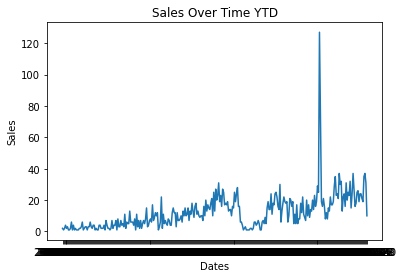

In [321]:
x = daily_quant.index

fig, ax = plt.subplots()

ax.plot(x, daily_quant['quantity-shipped'])
ax.set_title('Sales Over Time YTD')
ax.set_xlabel('Dates')
ax.set_ylabel('Sales')

<details>
    <summary>
        Expected Result:
    </summary>
    
    - 2020-11-16     37
    - 2020-11-02     37
    - 2020-11-28     37
    - 2020-10-14     70
    - 2020-10-13    127
</details>

### Question 8: Where are the majority of our units sold being shipped?

This will require some data cleaning. I would like to see data aggreggated by state - bonus points if you're able to provide a visual.

In [322]:
orders_df.head()

,Unnamed: 0,Unnamed: 0.1,amazon-order-id,merchant-order-id,shipment-id,shipment-item-id,amazon-order-item-id,merchant-order-item-id,purchase-date,payments-date,shipment-date,reporting-date,buyer-email,sku,quantity-shipped,currency,item-price,item-tax,shipping-price,shipping-tax,gift-wrap-price,gift-wrap-tax,ship-service-level,recipient-name,ship-address-2,ship-address-3,ship-city,ship-state,ship-postal-code,ship-country,ship-phone-number,bill-address-1,bill-address-2,bill-address-3,bill-city,bill-state,bill-postal-code,bill-country,item-promotion-discount,ship-promotion-discount,carrier,tracking-number,estimated-arrival-date,fulfillment-center-id,fulfillment-channel,sales-channel
0,0,0,113-0579650-0481014,NaN,DH7DZNqN3,D7fc5sHtR,4.270000e+12,NaN,2020-01-02T01:11:38+00:00,2020-01-03T10:31:23+00:00,2020-01-03T10:31:25+00:00,2020-01-03T11:31:31+00:00,gxjksfsm737p9py@marketplace.amazon.com,PB-AA,1,USD,29.99,2.23,0.0,0.0,0.0,0.0,Expedited,Ryan Kirkland,NaN,NaN,SOUTH SALT LAKE,UT,84115-3307,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA587335217000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
1,1,1,111-3082907-3413041,NaN,D4PrCzqF3,DHYmgwHNR,4.940000e+13,NaN,2020-01-02T01:12:11+00:00,2020-01-02T20:45:43+00:00,2020-01-02T20:45:43+00:00,2020-01-02T23:45:49+00:00,hj2l7qlggyk9rdk@marketplace.amazon.com,PB-AA,1,USD,29.99,3.00,0.0,0.0,0.0,0.0,Expedited,Laura Nicklay,NaN,NaN,AUBURN,WA,98001-2513,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,AMZN_US,TBA583523516000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
2,2,2,111-0252737-4993075,NaN,DskBxB95M,DkpSJgzzR,1.880000e+13,NaN,2020-01-07T22:58:32+00:00,2020-01-08T17:39:42+00:00,2020-01-08T16:55:02+00:00,2020-01-08T17:55:08+00:00,4mptds73qpw0chc@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,Christopher Arp,NaN,NaN,IOWA CITY,IA,52245-7801,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z9Y97F00375670720,2020-01-10T04:00:00+00:00,MKC6,AFN,Amazon.com
3,3,3,114-3125779-9788249,NaN,DvYsqPS3P,Dtw6jjfmR,4.120000e+13,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AAA,1,USD,24.99,1.50,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com
4,4,4,114-3125779-9788249,NaN,DvYsqPS3P,DHwzjjfmR,6.180000e+12,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.0,0.0,0.0,0.0,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com


In [330]:
location_shipped = orders_df[['ship-state', 'quantity-shipped']].groupby('ship-state').agg('sum')

# sort by quantity shipped for each state
location_shipped_sorted = location_shipped.sort_values(by='quantity-shipped', ascending=False)

# return last 5 rows 
location_shipped_sorted.head(n=5)

,quantity-shipped
ship-state,
CA,622
FL,241
TX,223
NY,214
WA,158


Text(0, 0.5, 'Quantity Sold')

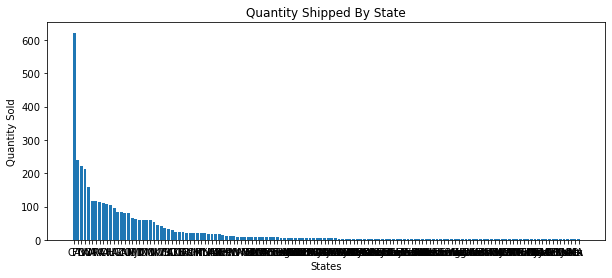

In [341]:
x = location_shipped_sorted.index

fig, ax = plt.subplots(figsize=(10, 4))

ax.bar(x, location_shipped_sorted['quantity-shipped'])
ax.set_title('Quantity Shipped By State')
ax.set_xlabel('States')
ax.set_ylabel('Quantity Sold')

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        CA, FL, TX, NY, WA 
    </p>
</details>

### Question 9: What percentage of our customers have purchased more than one unit?

In [377]:
# total customers - 2398
total_cust = orders_df['buyer-email'].nunique()

2398

In [516]:
# Repeat customers
repeat_df = orders_df[['buyer-email', 'quantity-shipped']]

# generate unique buyers and count of transactions per customer
group = repeat_df.groupby('buyer-email')['buyer-email'].agg('count')
group = group.to_frame()
group = group.rename(columns={'buyer-email': 'trans-counts'})

# filter by customers with multiple transactions - 601
repeat_df_filtered = group.loc[(group['trans-counts'] > 1)]
repeat_df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 601 entries, 0367s9fktkv9xbv@marketplace.amazon.com to zy5886sb49dk5sh@marketplace.amazon.com
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   trans-counts  601 non-null    int64
dtypes: int64(1)
memory usage: 9.4+ KB


In [503]:
# bulk buyers
bulk_buyers_df = orders_df[['buyer-email', 'quantity-shipped']]
bulk_buyers_df = bulk_buyers_df.groupby('buyer-email')['quantity-shipped'].sum()
bulk_buyers_df = bulk_buyers_df.to_frame()

# # transactions with purchases > 1 - 727
bulk_buyers_df = bulk_buyers_df.loc[(bulk_buyers_df['quantity-shipped'] > 1)]

# number of unique bulk customers - 727
bulk_buyers_df.index.nunique()
bulk_total = len(bulk_buyers_df)
bulk_total

727

In [511]:
# join bulk df with repeat df
mult_buyers = bulk_buyers_df.join(repeat_df_filtered, on='buyer-email')
mult_buyer_total = len(mult_buyers)
mult_buyer_total

727

In [512]:
# percent of customers buying > 1 = (bulk buyers + mult orders) / total customers
perc_mult = mult_buyer_total / total_cust
perc_mult


0.3031693077564637

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        0.303
    </p>
</details>

### Question 10: What percentage of our customers have ordered on more than one occasion? (What is our repeat buyer rate?)

In [750]:
# mult orders customers
mult_order_df = orders_df[['buyer-email', 'shipment-id']]

# number of unique customers -  2398
group = mult_order_df.groupby(['buyer-email', 'shipment-id'])['shipment-id'].agg('count')
group = group.to_frame()
group
group = group.rename(columns={'shipment-id': 'order-counts'})
group = group.dropna()
group = group.reset_index(level=['buyer-email', 'shipment-id'])
group.head()


# filter by order counts > 1 - 272
mult_order_filtered = group.loc[(group['order-counts'] > 1)]
mult_order_filtered

# filter by unique customers
mult_order_filtered = mult_order_filtered['buyer-email'].nunique()
mult_order_filtered

272

In [630]:
# num of customers with more than one shipment id / total customers

mult_order_filtered / total_cust

0.1134278565471226

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        0.133
    </p>
</details>

### Question 11: What is our average customer lifetime value of a repeat buyer?

In [633]:
orders_df

,Unnamed: 0,Unnamed: 0.1,amazon-order-id,merchant-order-id,shipment-id,shipment-item-id,amazon-order-item-id,merchant-order-item-id,purchase-date,payments-date,shipment-date,reporting-date,buyer-email,sku,quantity-shipped,currency,item-price,item-tax,shipping-price,shipping-tax,gift-wrap-price,gift-wrap-tax,ship-service-level,recipient-name,ship-address-2,ship-address-3,ship-city,ship-state,ship-postal-code,ship-country,ship-phone-number,bill-address-1,bill-address-2,bill-address-3,bill-city,bill-state,bill-postal-code,bill-country,item-promotion-discount,ship-promotion-discount,carrier,tracking-number,estimated-arrival-date,fulfillment-center-id,fulfillment-channel,sales-channel
0,0,0,113-0579650-0481014,NaN,DH7DZNqN3,D7fc5sHtR,4.270000e+12,NaN,2020-01-02T01:11:38+00:00,2020-01-03T10:31:23+00:00,2020-01-03T10:31:25+00:00,2020-01-03T11:31:31+00:00,gxjksfsm737p9py@marketplace.amazon.com,PB-AA,1,USD,29.99,2.23,0.00,0.00,0.00,0.00,Expedited,Ryan Kirkland,NaN,NaN,SOUTH SALT LAKE,UT,84115-3307,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,AMZN_US,TBA587335217000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
1,1,1,111-3082907-3413041,NaN,D4PrCzqF3,DHYmgwHNR,4.940000e+13,NaN,2020-01-02T01:12:11+00:00,2020-01-02T20:45:43+00:00,2020-01-02T20:45:43+00:00,2020-01-02T23:45:49+00:00,hj2l7qlggyk9rdk@marketplace.amazon.com,PB-AA,1,USD,29.99,3.00,0.00,0.00,0.00,0.00,Expedited,Laura Nicklay,NaN,NaN,AUBURN,WA,98001-2513,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,AMZN_US,TBA583523516000,2020-01-05T04:00:00+00:00,SMF1,AFN,Amazon.com
2,2,2,111-0252737-4993075,NaN,DskBxB95M,DkpSJgzzR,1.880000e+13,NaN,2020-01-07T22:58:32+00:00,2020-01-08T17:39:42+00:00,2020-01-08T16:55:02+00:00,2020-01-08T17:55:08+00:00,4mptds73qpw0chc@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.00,0.00,0.00,0.00,Expedited,Christopher Arp,NaN,NaN,IOWA CITY,IA,52245-7801,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,UPS,1Z9Y97F00375670720,2020-01-10T04:00:00+00:00,MKC6,AFN,Amazon.com
3,3,3,114-3125779-9788249,NaN,DvYsqPS3P,Dtw6jjfmR,4.120000e+13,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AAA,1,USD,24.99,1.50,0.00,0.00,0.00,0.00,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com
4,4,4,114-3125779-9788249,NaN,DvYsqPS3P,DHwzjjfmR,6.180000e+12,NaN,2020-01-08T19:47:14+00:00,2020-01-09T17:28:34+00:00,2020-01-09T17:28:34+00:00,2020-01-09T20:28:41+00:00,dtqdshhw0zj2lm6@marketplace.amazon.com,PB-AA,1,USD,29.99,1.80,0.00,0.00,0.00,0.00,Expedited,RYAN MCCONNELL,NaN,NaN,BATH,PA,18014-1631,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,UPS,1Z09271R0314650953,2020-01-11T04:00:00+00:00,JFK8,AFN,Amazon.com
5,5,5,112-0333755-0205815,NaN,DHnNgr9nM,DQBT4zlLR,5.530000e+13,NaN,2020-01-09T16:02:04+00:00,2020-01-09T21:01:43+00:00,2020-01-09T21:01:45+00:00,2020-01-09T22:01:50+00:00,4str5kqrhfjkmy1@marketplace.amazon.com,PB-AA,2,USD,59.98,3.60,0.00,0.00,0.00,0.00,Expedited,JohnPaul Catellier,NaN,NaN,WASHINGTON,DC,20001-3238,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,UPS,1Z736F270300827748,2020-01-11T04:00:00+00:00,LGA9,AFN,Amazon.com
6,6,6,112-4123005-1603402,NaN,DtGLNXHPT,DWdrYYcQR,7.180000e+12,NaN,2020-01-09T17:08:59+00:00,2020-01-13T06:54:04+00:00,2020-01-13T06:54:07+00:00,2020-01-13T07:54:13+00:00,wqzbk9xw5kr6zk3@marketplace.amazon.com,PB-AAA,1,USD,24.99,0.00,0.00,0.00,0.00,0.00,Standard,Maria Sancho,NaN,NaN,BISCAYNE PARK,FL,33161-6750,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,AMZN_US,TBA659865562000,2020-01-18T04:00:00+00:00,SMF1,AFN,Amazon.com
7,7,7,112-4123005-1603402,NaN,DtGLNXHPT,D7dpYYcQR,4.220000e+13,NaN,2020-01-09T17:08:59+00:00,2020-01-13T06:54:04+00:00,2020-01-13T06:54:07+00:00,2020-01-13T07:54:13+00:00,wqzbk9xw5kr6zk3@marketplace.amazon.com,PB-AA,1,USD,29.99,0.00,0.00,0.00,0.00,0.00,Standard,Maria Sancho,NaN,NaN,BISCAYNE PARK,FL,33161-6750,US,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [39]:
# average customer lifetime value of repeat customers
aclv_df = orders_df[['buyer-email', 'shipment-id']]

# number of unique customers -  2398
group = aclv_df.groupby(['buyer-email', 'shipment-id'])['shipment-id'].agg('count')
group = group.to_frame()
group
group = group.rename(columns={'shipment-id': 'order-counts'})
group = group.dropna()
group = group.reset_index(level=['buyer-email', 'shipment-id'])
group.head()


# filter by order counts > 1 - 298
aclv_filtered = group.loc[(group['order-counts'] > 1)]

# filter by unique customers - 249
aclv_filtered = aclv_filtered.drop_duplicates(subset=['buyer-email'], keep=False)
aclv_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249 entries, 9 to 2970
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   buyer-email   249 non-null    object
 1   shipment-id   249 non-null    object
 2   order-counts  249 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 7.8+ KB


In [40]:
# remove order counts (no longer needed)
aclv_filtered = aclv_filtered.drop(columns='order-counts')

In [41]:
# set buyer-email as index
aclv_filtered = aclv_filtered.set_index('buyer-email')
aclv_filtered.head()

,shipment-id
buyer-email,
049nsnn09j6v6m5@marketplace.amazon.com,D7KMjblLl
08z87tgrjk5n1qd@marketplace.amazon.com,DsPK2BxfG
0bnssjt3td3k001@marketplace.amazon.com,DfBLj17ll
0s9zlk0thccq04g@marketplace.amazon.com,DBcNXw51x
0t3gbrj3j8gqjtl@marketplace.amazon.com,D4rWVxYGS


In [42]:
# create df for returns with order-id to join to orders df (add True where order-id was a return)
aclv_return_df = returns_df['order-id']
aclv_return_df = aclv_return_df.to_frame()
aclv_return_df['returned'] = aclv_return_df.any(axis='columns')
aclv_return_df = aclv_return_df.set_index('order-id')
aclv_return_df.head()

,returned
order-id,
113-5704183-7856203,True
113-5681279-7985840,True
114-5172772-0242637,True
111-5918530-7037818,True
114-8687774-9880227,True


In [54]:
# create df with item-price and order-id and set buyer-email to index to join
spend_df = orders_df[['buyer-email','item-price', 'amazon-order-id']]
spend_df = spend_df.set_index('buyer-email')
spend_df.head()

,item-price,amazon-order-id
buyer-email,,
gxjksfsm737p9py@marketplace.amazon.com,29.99,113-0579650-0481014
hj2l7qlggyk9rdk@marketplace.amazon.com,29.99,111-3082907-3413041
4mptds73qpw0chc@marketplace.amazon.com,29.99,111-0252737-4993075
dtqdshhw0zj2lm6@marketplace.amazon.com,24.99,114-3125779-9788249
dtqdshhw0zj2lm6@marketplace.amazon.com,29.99,114-3125779-9788249


In [58]:
# join and set amazon order id at index - 779
aclv_spend = aclv_filtered.join(spend_df, on='buyer-email', how='inner')
aclv_spend = aclv_spend.reset_index()
aclv_spend = aclv_spend.set_index('amazon-order-id')
aclv_spend.head()

,buyer-email,shipment-id,item-price
amazon-order-id,,,
114-9001140-6141024,049nsnn09j6v6m5@marketplace.amazon.com,D7KMjblLl,24.99
114-9001140-6141024,049nsnn09j6v6m5@marketplace.amazon.com,D7KMjblLl,29.99
112-0420816-0161069,08z87tgrjk5n1qd@marketplace.amazon.com,DsPK2BxfG,29.99
112-0420816-0161069,08z87tgrjk5n1qd@marketplace.amazon.com,DsPK2BxfG,29.99
112-0420816-0161069,08z87tgrjk5n1qd@marketplace.amazon.com,DsPK2BxfG,29.99


In [59]:
# join order repeat buyer df with returns df by order-id - 651
aclv_spend_ret = aclv_spend.join(aclv_return_df, how='left', lsuffix='amazon-order-id', rsuffix='order-id')
aclv_spend_ret.info()

<class 'pandas.core.frame.DataFrame'>
Index: 651 entries, 111-0107811-0941011 to 114-9991576-1918654
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   buyer-email  651 non-null    object 
 1   shipment-id  651 non-null    object 
 2   item-price   651 non-null    float64
 3   returned     23 non-null     object 
dtypes: float64(1), object(3)
memory usage: 25.4+ KB


In [60]:
# remove rows from joined df where the order was returned - 628
aclv_spend_ret_rem = aclv_spend_ret[(aclv_spend_ret['returned'] != True)]
aclv_spend_ret_rem.info()

<class 'pandas.core.frame.DataFrame'>
Index: 628 entries, 111-0107811-0941011 to 114-9991576-1918654
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   buyer-email  628 non-null    object 
 1   shipment-id  628 non-null    object 
 2   item-price   628 non-null    float64
 3   returned     0 non-null      object 
dtypes: float64(1), object(3)
memory usage: 24.5+ KB


In [61]:
aclv_spend_ret_rem.head()

,buyer-email,shipment-id,item-price,returned
111-0107811-0941011,gjc95pvhyyjnyf3@marketplace.amazon.com,DxZCNVhr0,24.99,NaN
111-0107811-0941011,gjc95pvhyyjnyf3@marketplace.amazon.com,DxZCNVhr0,29.99,NaN
111-0309365-2917016,kz36tfxkfk5sp06@marketplace.amazon.com,DsWJRn9P0,24.99,NaN
111-0309365-2917016,kz36tfxkfk5sp06@marketplace.amazon.com,DsWJRn9P0,29.99,NaN
111-0336895-6421866,l0jrqwzwx09b41t@marketplace.amazon.com,DvjS3xgQl,49.98,NaN


In [895]:
# spend_df = spend_df.set_index('amazon-order-id')

In [62]:
# reset index to number 
aclv_spend_ret_rem  = aclv_spend_ret_rem.reset_index()
aclv_spend_ret_rem.head()

,index,buyer-email,shipment-id,item-price,returned
0,111-0107811-0941011,gjc95pvhyyjnyf3@marketplace.amazon.com,DxZCNVhr0,24.99,NaN
1,111-0107811-0941011,gjc95pvhyyjnyf3@marketplace.amazon.com,DxZCNVhr0,29.99,NaN
2,111-0309365-2917016,kz36tfxkfk5sp06@marketplace.amazon.com,DsWJRn9P0,24.99,NaN
3,111-0309365-2917016,kz36tfxkfk5sp06@marketplace.amazon.com,DsWJRn9P0,29.99,NaN
4,111-0336895-6421866,l0jrqwzwx09b41t@marketplace.amazon.com,DvjS3xgQl,49.98,NaN


In [63]:

aclv_group = aclv_spend_ret_rem.groupby(['buyer-email'])['item-price'].agg('sum').mean()
aclv_group 

90.79390243902418

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        90.938
    </p>
</details>

### Question 12: How long does it take for our repeat buyers to purchase their second order?

In [64]:
# mult orders customers
mult_order_df = orders_df[['buyer-email', 'shipment-id']]

# number of unique customers -  2398
group = mult_order_df.groupby(['buyer-email', 'shipment-id'])['shipment-id'].agg('count')
group = group.to_frame()
group
group = group.rename(columns={'shipment-id': 'order-counts'})
group = group.dropna()
group = group.reset_index(level=['buyer-email', 'shipment-id'])
group.head()


# filter by order counts > 1 - 272
mult_order_filtered = group.loc[(group['order-counts'] > 1)]
mult_order_filtered

# filter by unique customers - 272
mult_order_filtered = mult_order_filtered.drop_duplicates(subset=['buyer-email'], keep='first')
mult_order_filtered.head()

,buyer-email,shipment-id,order-counts
9,049nsnn09j6v6m5@marketplace.amazon.com,D7KMjblLl,2
19,08z87tgrjk5n1qd@marketplace.amazon.com,DsPK2BxfG,4
25,0bnssjt3td3k001@marketplace.amazon.com,DfBLj17ll,2
72,0s9zlk0thccq04g@marketplace.amazon.com,DBcNXw51x,3
81,0t3gbrj3j8gqjtl@marketplace.amazon.com,D4rWVxYGS,2


In [ ]:
# comparing purchase dates for different orders (they appear to be the same?)
orders_df[['buyer-email', 'shipment-id', 'purchase-date']]

In [ ]:
# spot checking buyer email who is a repeat buyer tho see if the purchase dates differ
orders_df[(orders_df['buyer-email'] == '08z87tgrjk5n1qd@marketplace.amazon.com')]

In [ ]:
# create df with dates and buyer-emails to join with mult_order_filtered with timestamp column for purchase date
df_dates_order = orders_df[['buyer-email', 'shipment-id', 'purchase-date']]
df_dates_order['purch-timestamp'] = pd.to_datetime(df_dates_order['purchase-date'], utc=True)

In [ ]:
df_dates_order = df_dates_order.drop(columns='purchase-date')

In [ ]:
mult_order_filtered.head()

In [ ]:
# num rows: 585
df_all_repeats = mult_order_filtered.merge(df_dates_order, on=['shipment-id', 'buyer-email'], how='inner', sort=False)
df_all_repeats

In [ ]:
# Use a dataframe generator to create a dataframe with emails and timestamp orders for each
# would then find the average difference between the 1st and 2nd order by creating a third column
# for the difference - would find the mean by aggregating 
diff_df = pd.DataFrame({'buyer-email': df_dates_filtered['buyer-email'],
                         'Tra'})

<details>
    <summary>
        Expected Result:
    </summary>
    <p>
        106672.59
    </p>
</details>